In [1]:
from __future__ import print_function
import sys
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import torchvision
import random
import os
import argparse
import numpy as np
from PreResNet_cifar import *
import dataloader_cifar as dataloader
from math import log2
from Contrastive_loss import *

import collections.abc
from collections.abc import MutableMapping
from flow_trainer import FlowTrainer
from tqdm import tqdm
%matplotlib inline

wandb = None

/train-data-1-ssd/andysu/workspace/flow/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
parser = argparse.ArgumentParser(description='PyTorch CIFAR Training')
parser.add_argument('--batch_size', default=64, type=int, help='train batchsize') 
parser.add_argument('--lr', '--learning_rate', default=0.02, type=float, help='initial learning rate')
parser.add_argument('--noise_mode',  default='sym')
parser.add_argument('--alpha', default=4, type=float, help='parameter for Beta')
parser.add_argument('--lambda_u', default=30, type=float, help='weight for unsupervised loss')
parser.add_argument('--lambda_c', default=0.025, type=float, help='weight for contrastive loss')
parser.add_argument('--T', default=0.5, type=float, help='sharpening temperature')
parser.add_argument('--num_epochs', default=350, type=int)
parser.add_argument('--r', default=0.5, type=float, help='noise ratio')
parser.add_argument('--d_u',  default=0.7, type=float)
parser.add_argument('--tau', default=5, type=float, help='filtering coefficient')
parser.add_argument('--metric', type=str, default = 'JSD', help='Comparison Metric')
parser.add_argument('--seed', default=123)
# parser.add_argument('--gpuid', default=0, type=int)
parser.add_argument('--resume', default=False, type=bool, help = 'Resume from the warmup checkpoint')
parser.add_argument('--num_class', default=10, type=int)
parser.add_argument('--data_path', default='./data/cifar10', type=str, help='path to dataset')
parser.add_argument('--dataset', default='cifar10', type=str)
parser.add_argument('--cond_size', default=512, type=int)
parser.add_argument('--warm_up', default=10, type=int)
parser.add_argument('--center_momentum', default=0.9, type=float, help='use centering')
parser.add_argument('--flow_modules', default="8-8-8-8", type=str)
# parser.add_argument('--flow_modules', default="64-64-64-64", type=str)
parser.add_argument('--tol', default=1e-5, type=float, help='flow atol, rtol')
parser.add_argument('--gpuid', default="0", help='comma separated list of GPU(s) to use.')
parser.add_argument('--lossType', default='nll', type=str, choices=['nll', 'ce', 'mix'], help = 'useing nll, ce or nll + ce loss')

# args = parser.parse_args()
args = parser.parse_args(args=['--gpuid', '0', '--dataset', 'cifar10', '--data_path', './data/cifar10', '--num_class', '10', '--r', '0.2'])
# args = parser.parse_args(args=['--gpuid', '0', '--dataset', 'cifar100', '--data_path', './data/cifar100', '--num_class', '100', '--r', '0'])

## GPU Setup 
# torch.cuda.set_device(args.gpuid)
os.environ['CUDA_VISIBLE_DEVICES'] = args.gpuid
random.seed(args.seed)
torch.manual_seed(args.seed)
torch.cuda.manual_seed_all(args.seed)

In [3]:

## Download the Datasets
if args.dataset== 'cifar10':
    torchvision.datasets.CIFAR10(args.data_path,train=True, download=True)
    torchvision.datasets.CIFAR10(args.data_path,train=False, download=True)
else:
    torchvision.datasets.CIFAR100(args.data_path,train=True, download=True)
    torchvision.datasets.CIFAR100(args.data_path,train=False, download=True)


Files already downloaded and verified
Files already downloaded and verified


In [4]:
# folder = args.dataset + '_' + args.noise_mode + '_' + str(args.r)+'_cleanUNICON'
# folder = args.dataset + '_' + args.noise_mode + '_' + str(args.r)+'_normal'
# folder = 'cifar100_sym_0.2_flow_wo_centering'
folder = 'cifar10_sym_0.2_flow_wo_centering'
# folder = 'cifar100_sym_0.0_flow_clean_NoiseFlow'
print(folder)
model_save_loc = './checkpoint/' + folder
stats_log=open(model_save_loc +'/%s_%.1f_%s'%(args.dataset,args.r,args.noise_mode)+'_stats_test.txt','w') 
test_log=open(model_save_loc +'/%s_%.1f_%s'%(args.dataset,args.r,args.noise_mode)+'_acc_test.txt','w')     
test_loss_log = open(model_save_loc +'/test_loss_test.txt','w')
train_acc = open(model_save_loc +'/train_acc_test.txt','w')
train_loss = open(model_save_loc +'/train_loss.txt','w')

cifar10_sym_0.2_flow_wo_centering


In [5]:
# KL divergence
def kl_divergence(p, q):
    return (p * ((p+1e-10) / (q+1e-10)).log()).sum(dim=1)

## Jensen-Shannon Divergence 
class Jensen_Shannon(nn.Module):
    def __init__(self):
        super(Jensen_Shannon,self).__init__()
        pass
    def forward(self, p,q):
        m = (p+q)/2
        return 0.5*kl_divergence(p, m) + 0.5*kl_divergence(q, m)

## Calculate JSD
def Calculate_JSD(model1, model2, num_samples):  
    JS_dist = Jensen_Shannon()
    JSD   = torch.zeros(num_samples)    

    for batch_idx, (inputs, targets, index) in enumerate(eval_loader):
        inputs, targets = inputs.cuda(), targets.cuda()
        batch_size = inputs.size()[0]

        ## Get outputs of both network
        with torch.no_grad():
            out1 = torch.nn.Softmax(dim=1).cuda()(model1(inputs)[1])     
            out2 = torch.nn.Softmax(dim=1).cuda()(model2(inputs)[1])

        ## Get the Prediction
        out = (out1 + out2)/2     

        ## Divergence clculator to record the diff. between ground truth and output prob. dist.  
        dist = JS_dist(out,  F.one_hot(targets, num_classes = args.num_class))
        JSD[int(batch_idx*batch_size):int((batch_idx+1)*batch_size)] = dist

    return JSD
## Unsupervised Loss coefficient adjustment 
def linear_rampup(current, warm_up, rampup_length=16):
    current = np.clip((current-warm_up) / rampup_length, 0.0, 1.0)
    return args.lambda_u*float(current)

class SemiLoss(object):
    def __call__(self, outputs_x, targets_x, outputs_u, targets_u, epoch, warm_up):
        probs_u = torch.softmax(outputs_u, dim=1)
        Lx = -torch.mean(torch.sum(F.log_softmax(outputs_x, dim=1) * targets_x, dim=1))
        Lu = torch.mean((probs_u - targets_u)**2)
        return Lx, Lu, linear_rampup(epoch,warm_up)

class NegEntropy(object):
    def __call__(self,outputs):
        probs = torch.softmax(outputs, dim=1)
        return torch.mean(torch.sum(probs.log()*probs, dim=1))

def create_model():
    model = ResNet18(num_classes=args.num_class, feature_dim=args.cond_size)
    model = model.cuda()
    return model

In [6]:
## Test Accuracy
def test(epoch,net1,net2, flow1, flow2):
    net1.eval()
    net2.eval()

    num_samples = 1000
    correct = 0
    total = 0
    loss_x = 0
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(test_loader):
            inputs, targets = inputs.cuda(), targets.cuda()
            _, outputs1 = net1(inputs)
            _, outputs2 = net2(inputs)           
            outputs = outputs1+outputs2
            _, predicted = torch.max(outputs, 1)            
            # loss = CEloss(outputs, targets)  
            # loss_x += loss.item()

            total += targets.size(0)
            correct += predicted.eq(targets).cpu().sum().item()  

    acc = 100.*correct/total
    print("\n| Test Epoch #%d\t Accuracy: %.2f%%\n" %(epoch,acc))  
    test_log.write(str(acc)+'\n')
    test_log.flush()  
    # test_loss_log.write(str(loss_x/(batch_idx+1))+'\n')
    test_loss_log.flush()
    return acc

In [7]:
## Choose Warmup period based on Dataset
num_samples = 50000
if args.dataset=='cifar10':
    warm_up = 10
elif args.dataset=='cifar100':
    warm_up = 30

In [8]:
## Call the dataloader
loader = dataloader.cifar_dataloader(args.dataset, r=args.r, noise_mode=args.noise_mode,batch_size=args.batch_size,num_workers=4,\
    root_dir=model_save_loc, noise_file='%s/clean_%.4f_%s.npz'%(args.data_path,args.r, args.noise_mode))

In [9]:
print('| Building net')
net1 = create_model()
net2 = create_model()
cudnn.benchmark = True

| Building net


In [10]:
## Resume from the warmup checkpoint 
model_name_1 = 'Net_warmup_1.pth'
model_name_2 = 'Net_warmup_2.pth'    

## load warmup model
net1.load_state_dict(torch.load(os.path.join(model_save_loc, model_name_1))['net'])
net2.load_state_dict(torch.load(os.path.join(model_save_loc, model_name_2))['net'])
epoch = torch.load(os.path.join(model_save_loc, model_name_1))['epoch']
best_acc = 0

In [11]:
model_name_1 = 'Net_1.pth'
model_name_2 = 'Net_2.pth'  
## load warmup model
net1.load_state_dict(torch.load(os.path.join(model_save_loc, model_name_1))['net'])
net2.load_state_dict(torch.load(os.path.join(model_save_loc, model_name_2))['net'])
epoch = torch.load(os.path.join(model_save_loc, model_name_1))['epoch']

In [12]:
flowTrainer = FlowTrainer(args)

flowNet1 = flowTrainer.create_model()
flowNet2 = flowTrainer.create_model()

model_flow_name_1 = "FlowNet_1.pth"
model_flow_name_2 = "FlowNet_2.pth"

flowNet1.load_state_dict(torch.load(os.path.join(model_save_loc, model_flow_name_1))['net'])
flowNet2.load_state_dict(torch.load(os.path.join(model_save_loc, model_flow_name_2))['net'])

Training T : 1.0
Number of trainable parameters of Point CNF: 43569
Training T : 1.0
Number of trainable parameters of Point CNF: 43569


<All keys matched successfully>

In [13]:
train_loader = loader.run(0, 'warmup')

In [14]:
def testByFlow(epoch, net1, flowNet1, net2, flowNet2, test_loader, test_num = -1):
    print("\n====Test====\n")
    net1.eval()
    flowNet1.eval()
    net2.eval()
    flowNet2.eval()
    
    total = 0

    # flow acc
    correct_flow = 0
    prob_sum_flow = 0

    # cross entropy acc
    correct_ce = 0
    prob_sum_ce = 0

    correct_mix = 0
    prob_sum_mix = 0

    with torch.no_grad():
        for batch_idx, (inputs, targets, true_label) in tqdm(enumerate(test_loader)):
            inputs, targets = inputs.cuda(), targets.cuda()
            true_label = true_label.cuda()
            targets = true_label
            _, logits1, feature1 = net1(inputs, get_feature = True)
            outputs1 = flowTrainer.predict(flowNet1, feature1)

            _, logits2, feature2 = net2(inputs, get_feature = True)
            outputs2 = flowTrainer.predict(flowNet2, feature2)

            total += targets.size(0)

            logits  = (torch.softmax(logits1, dim=1) + torch.softmax(logits2, dim=1)) / 2
            outputs = (outputs1 + outputs2) / 2

            prob_ce, predicted_ce = torch.max(logits, 1)

            prob_flow, predicted_flow = torch.max(outputs, 1)

            prob_mix, predicted_mix = torch.max(0.5 * logits + 0.5 * outputs, 1)

            correct_ce += predicted_ce.eq(targets).cpu().sum().item()  
            prob_sum_ce += prob_ce.cpu().sum().item()

            correct_flow += predicted_flow.eq(targets).cpu().sum().item()  
            prob_sum_flow += prob_flow.cpu().sum().item()

            correct_mix += predicted_mix.eq(targets).cpu().sum().item()  
            prob_sum_mix += prob_mix.cpu().sum().item()

            if test_num > 0 and total >= test_num:
                break

    acc_ce = 100.*correct_ce/total
    confidence_ce = prob_sum_ce/total
            
    acc_flow = 100.*correct_flow/total
    confidence_flow = prob_sum_flow/total

    acc_mix = 100.*correct_mix/total
    confidence_mix = prob_sum_mix/total


    acc = acc_flow
    confidence = confidence_flow
    
    print("\n| Test Epoch #%d\t Accuracy: %.2f%%\t Condifence: %.2f%%\n" %(epoch, acc, confidence))
    
    return acc, confidence

In [15]:
test_loader = loader.run(0, 'warmup')

# acc = test(epoch,net1,net2)
testByFlow(epoch, net1, flowNet1, net2, flowNet2, test_loader)


====Test====



391it [01:02,  6.25it/s]


| Test Epoch #334	 Accuracy: 97.31%	 Condifence: 1.00%



(97.31, 0.9982788026428223)

In [32]:
## Test Accuracy
def getFeature(net, flow, loader):
    net.eval()   
    flow.eval() 
    features = []
    labels = []
    pred_label = []
    true_labels = []
    pred_values = []
    hard_samples = []
    hard_preds = []

    with torch.no_grad():
        for batch_idx, (inputs, targets, true_label) in enumerate(loader):
            inputs, targets = inputs.cuda(), targets.cuda()
            true_label = true_label.cuda()
            _, _, feature = net(inputs, get_feature = True)
            pred_value = flowTrainer.predict(flow, feature)
            pred = torch.argmax(pred_value, dim=1)
            
            features.append(feature)
            labels.append(targets)
            pred_label.append(pred)
            true_labels.append(true_label)
            pred_values.append(pred_value)
            
            hard_samples.append(inputs[(pred != true_label) & (targets == true_label) & (true_label == 5)])
            hard_preds.append(pred[(pred != true_label) & (targets == true_label) & (true_label == 5)])

    features = torch.cat(features, dim=0)
    labels = torch.cat(labels, dim=0)
    pred_label = torch.cat(pred_label, dim=0)
    true_labels = torch.cat(true_labels, dim=0)
    pred_values = torch.cat(pred_values, dim=0)
    hard_samples = torch.cat(hard_samples, dim=0)
    hard_preds = torch.cat(hard_preds, dim=0)
    
    print("features list", features.size())
    return features.cpu(), labels.cpu(), pred_label.cpu(), true_labels.cpu(), pred_values.cpu(), hard_samples.cpu(), hard_preds.cpu()

In [33]:
features, labels, preds, true_labels, pred_values, hard_samples, hard_preds = getFeature(net1, flowNet1, test_loader)
print("pred_values", pred_values.size())
# labels = true_labels

features list torch.Size([50000, 512])
pred_values torch.Size([50000, 10])


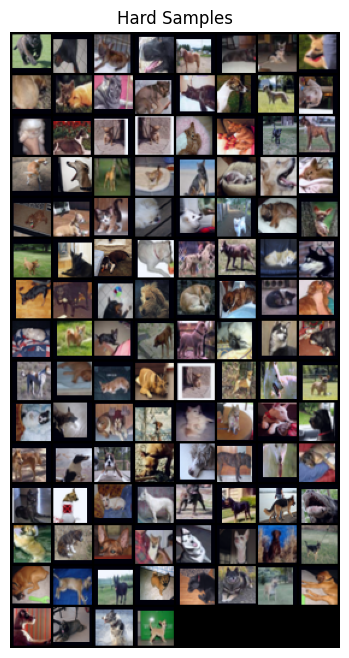

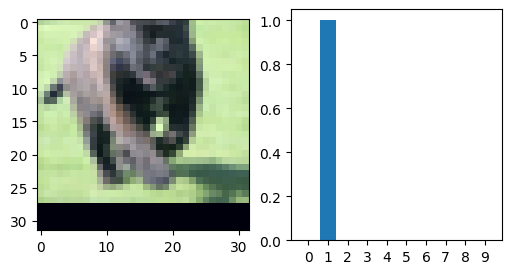

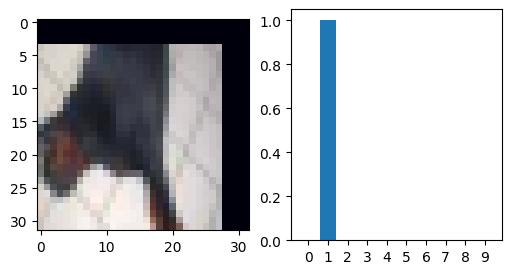

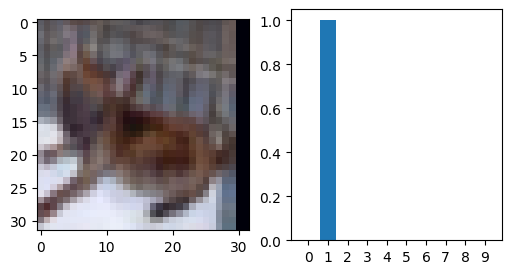

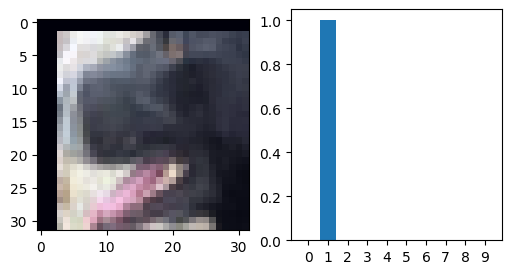

...

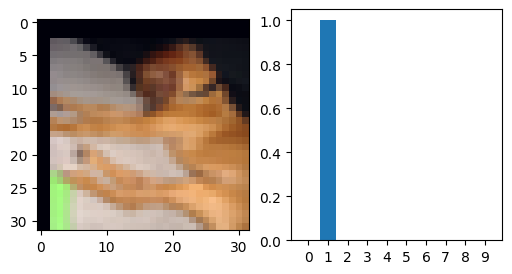

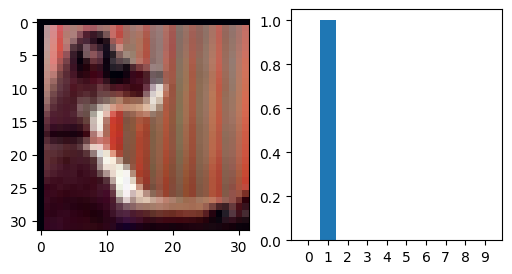

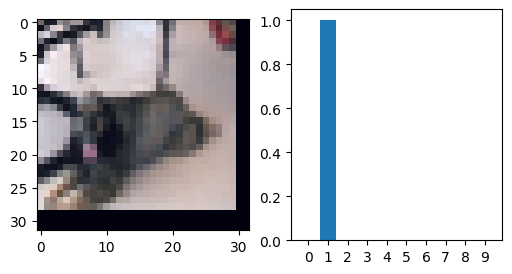

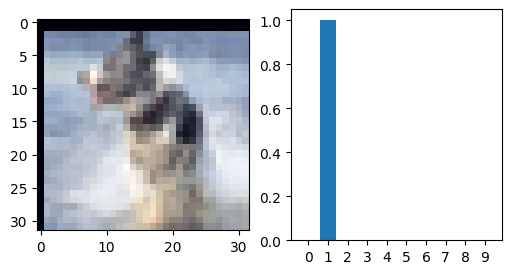

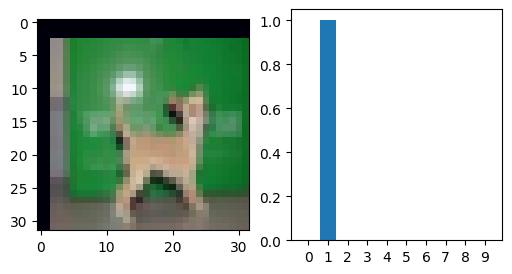

In [34]:
# draw hard samples
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np

# def drawHardSamples(hard_samples, num_samples = 10):
#     plt.figure(figsize=(8,8))
#     plt.axis("off")
#     plt.title("Hard Samples")
#     plt.imshow(np.transpose(vutils.make_grid(hard_samples[:num_samples], padding=2, normalize=True).cpu(),(1,2,0)))
#     plt.show()

# drawhard samples with pred values(bar chat)
# one image with one bar chat
# bar和 image 一左一右
def drawHardSamplesWithPred(hard_samples, hard_preds, num_samples = 10, num_classes = 100):
    
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title("Hard Samples")
    plt.imshow(np.transpose(vutils.make_grid(hard_samples[:num_samples], padding=2, normalize=True).cpu(),(1,2,0)))
    plt.show()

    for i in range(min(num_samples, hard_samples.size()[0])):
        plt.figure(figsize=(6,3))
        plt.subplot(1, 2, 1)
        normalized_image = (hard_samples[i] - hard_samples[i].min()) / (hard_samples[i].max() - hard_samples[i].min())
        plt.imshow(np.transpose(normalized_image,(1,2,0)))
        
        plt.subplot(1, 2, 2)
        plt.bar(np.arange(num_classes), pred_values[hard_preds[i]])
        plt.xticks(np.arange(num_classes), np.arange(num_classes))
        
        plt.show()
    
    
# drawHardSamples(hard_samples)
drawHardSamplesWithPred(hard_samples, hard_preds, 10000, args.num_class)


In [19]:
target_num = 10

In [20]:
labels_target = labels[true_labels <= target_num]
features_target = features[true_labels <= target_num]
preds = preds[true_labels <= target_num]
pred_values = pred_values[true_labels <= target_num]
true_labels = true_labels[true_labels <= target_num]

In [21]:
from sklearn.manifold import TSNE

def tsne_reduce(data):
    tsne = TSNE(n_components=2, random_state=1)
    return tsne.fit_transform(data)

In [22]:
feature2D = tsne_reduce(features_target.cpu())

In [23]:
# if labels_target == pred then correct
preds = preds.cpu()
labels_target = labels_target.cpu()
data_by_correct = feature2D[true_labels == preds]
data_by_incorrect = feature2D[true_labels != preds]

data_by_noise_sample = feature2D[labels_target != true_labels]
data_by_hard_sample = feature2D[(preds != true_labels) & (labels_target == true_labels)]
data_by_clean_sample = feature2D[(preds == true_labels) & (labels_target == true_labels)]


In [24]:
labels_target = labels_target.cpu()
preds = preds.cpu()
true_labels = true_labels.cpu()
pred_values = pred_values.cpu()

pred_noise = pred_values[(labels_target != true_labels)]
pred_hard = pred_values[(preds != true_labels) & (labels_target == true_labels)]
pred_clean = pred_values[(preds == true_labels) & (labels_target == true_labels)]

# calculate the mean confidence
def getMeanConfidence(preds):
    return torch.mean(torch.max(preds, dim=1)[0])

mean_confidence_noise = getMeanConfidence(pred_noise)
mean_confidence_hard = getMeanConfidence(pred_hard)
mean_confidence_clean = getMeanConfidence(pred_clean)

print("mean_confidence_noise", mean_confidence_noise)
print("mean_confidence_hard", mean_confidence_hard)
print("mean_confidence_clean", mean_confidence_clean)


mean_confidence_noise tensor(0.9981)
mean_confidence_hard tensor(0.9794)
mean_confidence_clean tensor(0.9994)


In [25]:
# calculate the label variance

def getLabelVariance(preds):
    return torch.var(torch.argmax(preds, dim=1).float())

label_variance_noise = getLabelVariance(pred_noise)
label_variance_hard = getLabelVariance(pred_hard)
label_variance_clean = getLabelVariance(pred_clean)

print("label_variance_noise", label_variance_noise)
print("label_variance_hard", label_variance_hard)
print("label_variance_clean", label_variance_clean)


label_variance_noise tensor(8.2644)
label_variance_hard tensor(7.6086)
label_variance_clean tensor(8.2739)


In [26]:
print(len(data_by_correct))
print(len(data_by_incorrect))

data_by_pred = [data_by_correct, data_by_incorrect]

data_by_ptpye = [data_by_clean_sample, data_by_noise_sample, data_by_hard_sample]

48653
1347


In [27]:
unique_labels = np.unique(true_labels)
data_by_label = [feature2D[true_labels == label] for label in unique_labels]

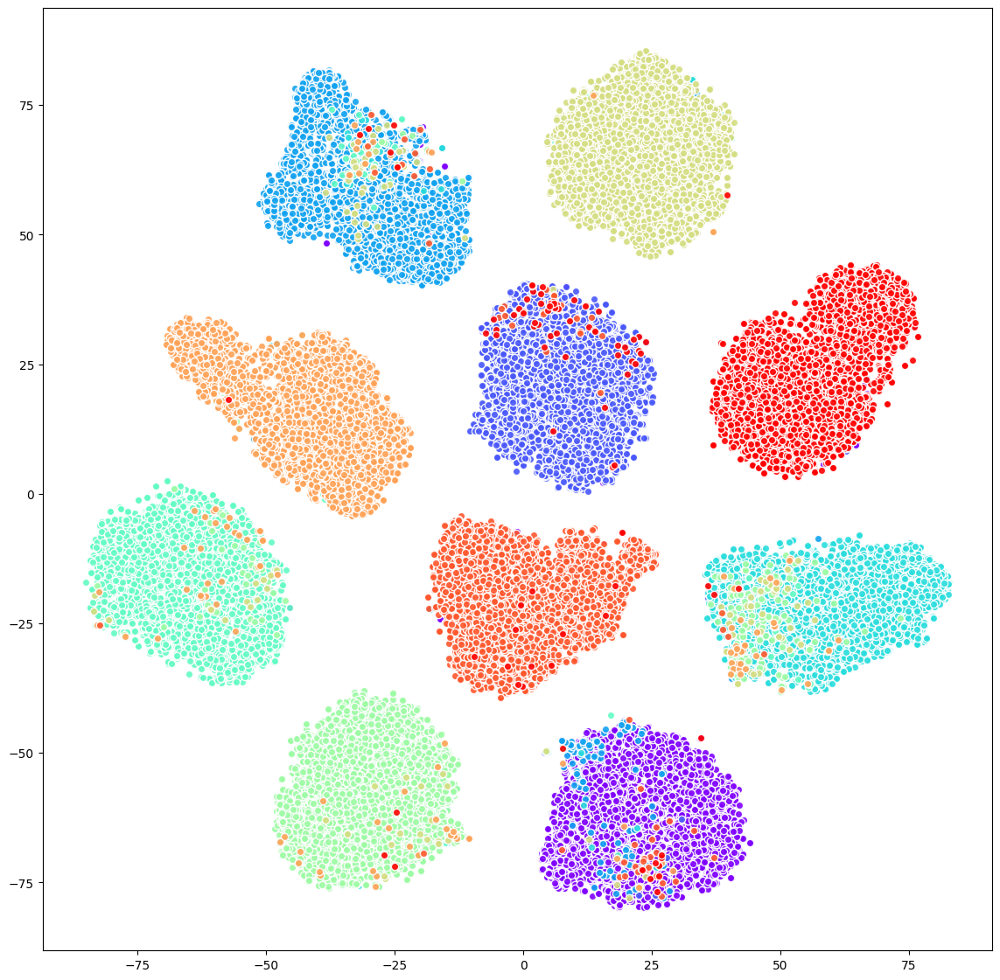

In [28]:
import matplotlib.pyplot as plt
f = plt.figure()
f.set_figheight(14)
f.set_figwidth(14)

colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
for label, color, data in zip(unique_labels, colors, data_by_label):
    plt.scatter(data[:, 0], data[:, 1], color=color, label=label, alpha=0.9, edgecolors='w')

plt.show()

f.savefig(f"{model_save_loc}/{args.dataset}_{args.noise_mode}_{str(args.r)}_{epoch}_t-sne_class.png", bbox_inches='tight')

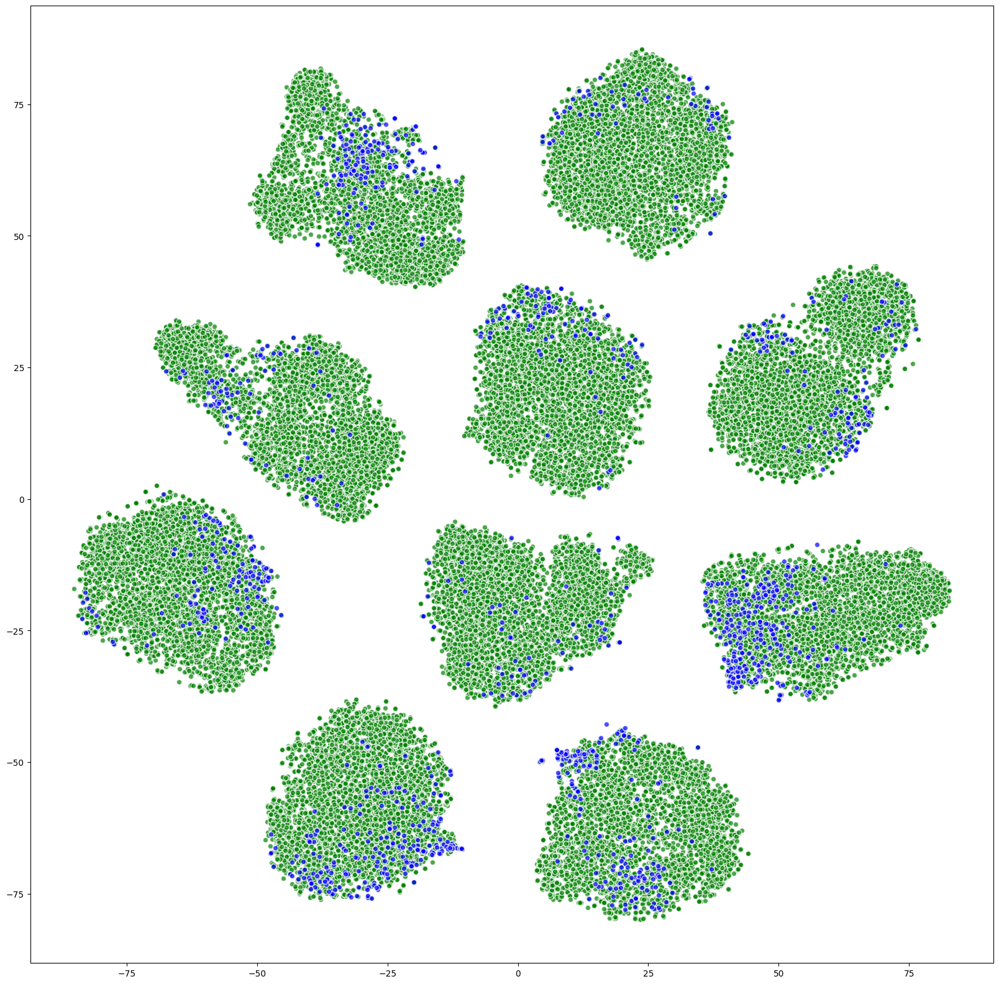

In [29]:
import matplotlib.pyplot as plt


f = plt.figure()
#size
f.set_figheight(20)
f.set_figwidth(20)

# colors = plt.cm.rainbow(np.linspace(0, 1, 2))
colors = ["green", "blue"]
for label, color, data in zip(["True", "False"], colors, data_by_pred):
    plt.scatter(data[:, 0], data[:, 1], color=color, label=label, alpha=0.7, edgecolors='w')

plt.show()

f.savefig(f"{model_save_loc}/{args.dataset}_{args.noise_mode}_{str(args.r)}_{epoch}_t-sne.png", bbox_inches='tight')

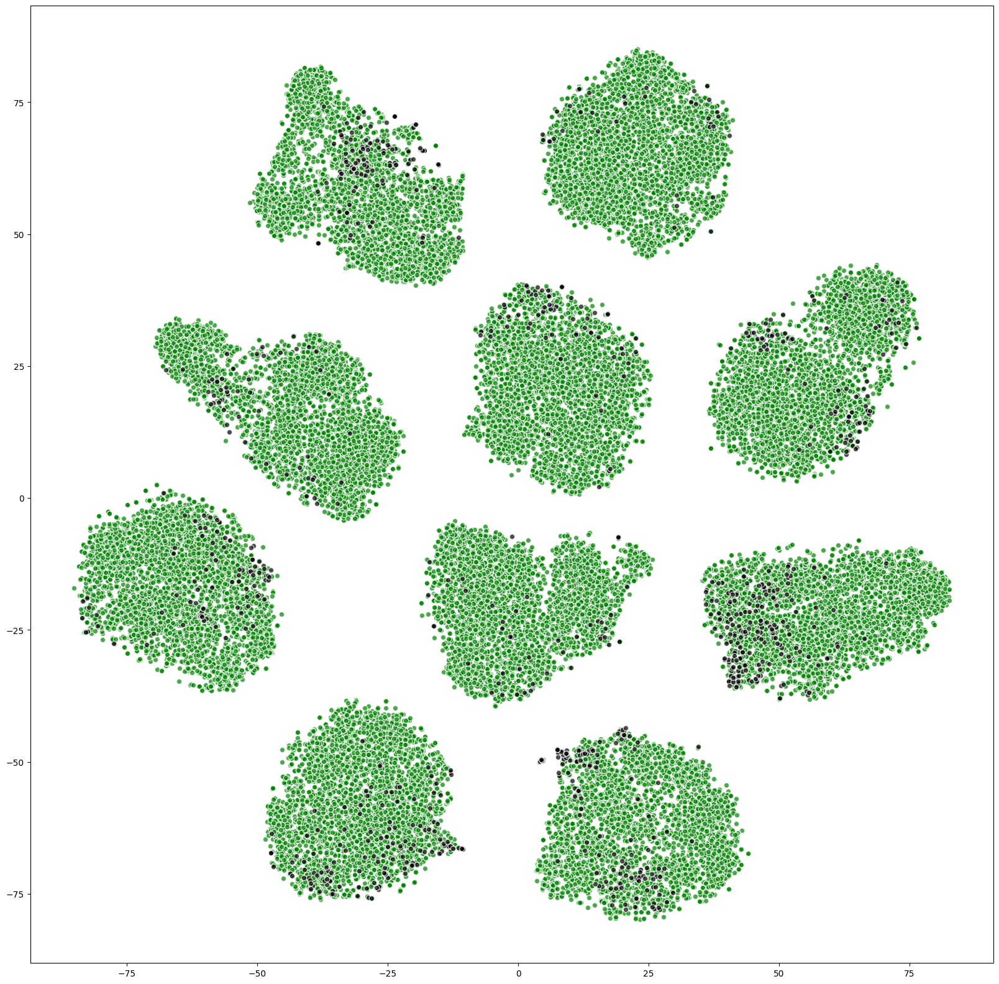

In [30]:
f = plt.figure()
#size
f.set_figheight(20)
f.set_figwidth(20)

# colors = plt.cm.rainbow(np.linspace(0, 1, 2))
colors = ["green", "blue", "black"]
for label, color, data in zip(["clean", "noise", "hard"], colors, data_by_ptpye):
    if label == "noise":
        continue
    plt.scatter(data[:, 0], data[:, 1], color=color, label=label, alpha=0.7, edgecolors='w')

plt.show()

f.savefig(f"{model_save_loc}/{args.dataset}_{args.noise_mode}_{str(args.r)}_{epoch}_t-sne_hard.png", bbox_inches='tight')

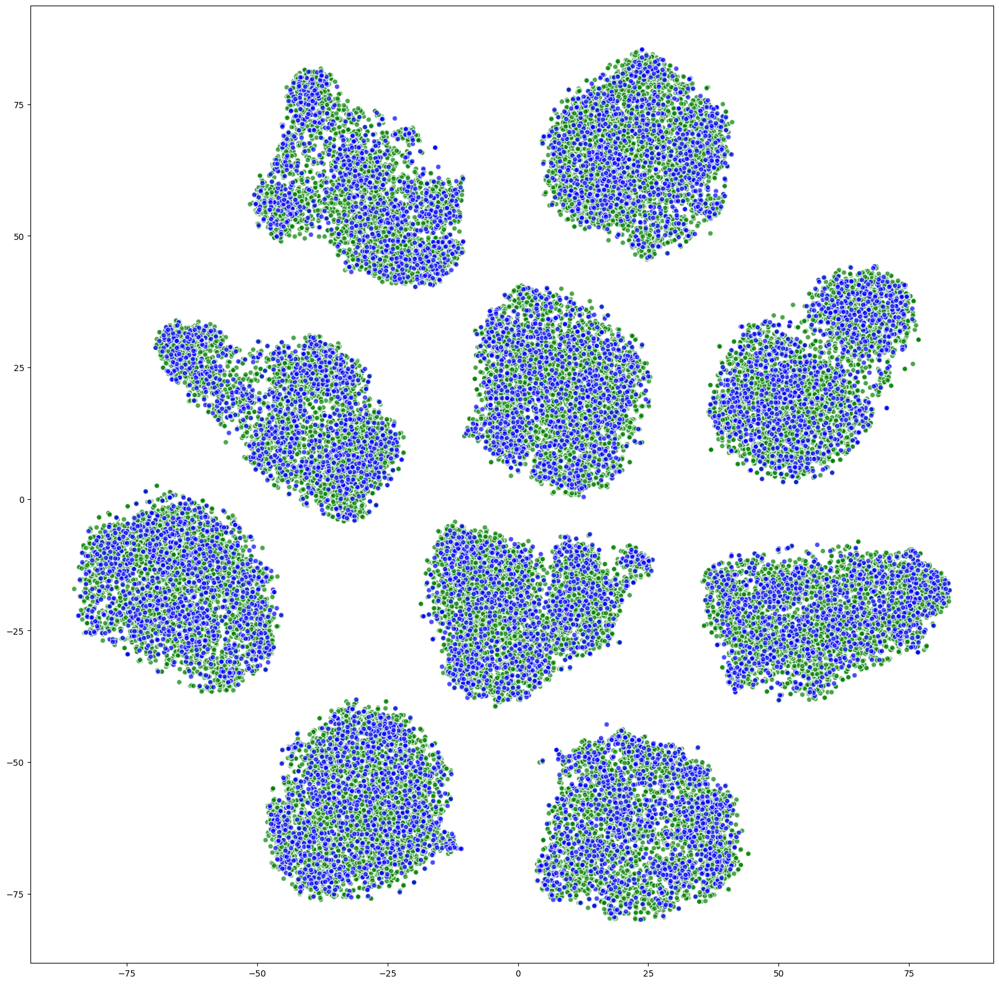

In [31]:
f = plt.figure()
#size
f.set_figheight(20)
f.set_figwidth(20)

# colors = plt.cm.rainbow(np.linspace(0, 1, 2))
colors = ["green", "blue", "black"]
for label, color, data in zip(["clean", "noise", "hard"], colors, data_by_ptpye):
    if label == "hard":
        continue
    plt.scatter(data[:, 0], data[:, 1], color=color, label=label, alpha=0.7, edgecolors='w')

plt.show()

f.savefig(f"{model_save_loc}/{args.dataset}_{args.noise_mode}_{str(args.r)}_{epoch}_t-sne_noise.png", bbox_inches='tight')